In [2]:
import os

In [4]:
#Importando dataset
!wget https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip

--2024-04-28 22:04:10--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.163.207, 142.251.167.207, 172.253.62.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.163.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘cats_and_dogs_filtered.zip’

cats_and_dogs_filte 100%[===================>]  65.43M  65.3MB/s    in 1.0s    

2024-04-28 22:04:11 (65.3 MB/s) - ‘cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [5]:
#Descompactando arquivo
!unzip cats_and_dogs_filtered.zip

Archive:  cats_and_dogs_filtered.zip
   creating: cats_and_dogs_filtered/
  inflating: cats_and_dogs_filtered/vectorize.py  
   creating: cats_and_dogs_filtered/validation/
   creating: cats_and_dogs_filtered/train/
   creating: cats_and_dogs_filtered/validation/dogs/
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2127.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2126.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2125.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2124.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2123.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2122.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2121.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2120.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2119.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2118.jpg  
  inflating: cats_and_dogs_filtered/validation/dogs/dog.2117.

In [6]:
#Excluindo arquivo compactado
!rm -rf cats_and_dogs_filtered.zip

In [7]:
#instalando tensorflow
!pip install tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 3.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.7/133.7 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 70.6 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 64.7 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 26.8 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 46.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 39.4 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 70.5 MB/s eta 0:00:00:00:01
   ━━━━━

In [3]:
# Importando bibliotecas necessárias para o projeto
import os  # Para interação com o sistema operacional
import matplotlib.pyplot as plt  # Para plotagem de gráficos
import tensorflow as tf  # Para construção e treinamento de modelos de deep learning

2024-04-28 23:51:14.720304: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-28 23:51:14.754330: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-28 23:51:15.859778: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-28 23:51:18.420388: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-28 23:51:21.264768: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF

In [39]:
# Criando o caminho do diretório principal do dataset a partir do diretório atual de trabalho
dataset_dir = os.path.join(os.getcwd(), 'cats_and_dogs_filtered')

# Criando o caminho do diretório de treinamento dentro do diretório principal do dataset
dataset_train_dir = os.path.join(dataset_dir, 'train')
# Contando o número de imagens de gatos no diretório de treinamento
dataset_train_cats_len = len(os.listdir(os.path.join(dataset_train_dir, 'cats')))
# Contando o número de imagens de cachorros no diretório de treinamento
dataset_train_dogs_len = len(os.listdir(os.path.join(dataset_train_dir, 'dogs')))

# Criando o caminho do diretório de validação dentro do diretório principal do dataset
dataset_validation_dir = os.path.join(dataset_dir, 'validation')
# Contando o número de imagens de gatos no diretório de validação
dataset_validation_cats_len = len(os.listdir(os.path.join(dataset_validation_dir, 'cats')))
# Contando o número de imagens de cachorros no diretório de validação
dataset_validation_dogs_len = len(os.listdir(os.path.join(dataset_validation_dir, 'dogs')))

# Imprimindo o número de imagens de gatos e cachorros nos diretórios de treinamento e validação
print('Train Cats: %s' % dataset_train_cats_len)
print('Train Dogs: %s' % dataset_train_dogs_len)
print('Validation Cats: %s' % dataset_validation_cats_len)
print('Validation Dogs: %s' % dataset_validation_dogs_len)

Train Cats: 1000
Train Dogs: 1000
Validation Cats: 500
Validation Dogs: 500


In [40]:
# Definindo as dimensões das imagens para padronização antes do treinamento
image_width = 160  # Largura da imagem em pixels
image_height = 160  # Altura da imagem em pixels
image_color_channel = 3  # Número de canais de cor (RGB)
image_color_channel_size = 255  # Máximo valor para um canal de cor (8 bits por canal)
image_size = (image_width, image_height)  # Tupla com as dimensões da imagem
image_shape = image_size + (image_color_channel,)  # Formato final da imagem incluindo canais de cor

# Configurações de treinamento
batch_size = 32  # Número de amostras processadas antes da atualização do modelo
epochs = 20  # Número total de passagens pelo dataset completo
learning_rate = 0.0001  # Taxa de aprendizagem, controla o tamanho do passo na atualização dos pesos

# Definindo os nomes das classes para a saída do modelo
class_names = ['cat', 'dog']  # Array de saída, posição 0 para 'cat' e 1 para 'dog'

In [41]:
# Criando um objeto dataset de treino com imagens do diretório especificado
# Este objeto será usado para alimentar o modelo durante o treinamento, fornecendo as imagens em lotes
dataset_train = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_train_dir,  # Caminho do diretório que contém o dataset de treino
    image_size=image_size,  # Tamanho das imagens após serem redimensionadas, definido anteriormente
    batch_size=batch_size,  # Tamanho do lote de imagens a serem fornecidas ao modelo em cada iteração
    shuffle=True  # Embaralha o dataset para garantir que os lotes sejam aleatórios, o que ajuda na generalização do modelo
)

Found 2000 files belonging to 2 classes.


In [42]:
# Criando um objeto dataset de validação com imagens do diretório especificado
# Este objeto é usado para validar o desempenho do modelo durante o treinamento
# As imagens de validação não são usadas para ajustar os parâmetros do modelo, apenas para avaliação
dataset_validation = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_validation_dir,  # Caminho do diretório que contém o dataset de validação
    image_size=image_size,  # Tamanho das imagens após serem redimensionadas, conforme definido anteriormente
    batch_size=batch_size,  # Tamanho do lote de imagens a serem fornecidas ao modelo em cada iteração
    shuffle=True  # Embaralha o dataset para garantir que os lotes sejam aleatórios, o que ajuda na avaliação justa do modelo
)

Found 1000 files belonging to 2 classes.


In [43]:
# Calculando a cardinalidade (número total de batches) do dataset de validação
#dataset teste construído com base em um pedaço do dataset validação.
# neste caso, está sendo direcionado a quinta parte para teste
#a cardinalidade inicial é de 1000/32 = 31.25
# o dataset de teste fica com cardinalidade 6 * 32 imagens (features)
# e dataset de validação fica com cardinalidade 26 * 32 imagens (features)
#esse dataset será utilizado no final para testar o modelo
dataset_validation_cardinality = tf.data.experimental.cardinality(dataset_validation)

# Determinando o número de batches a serem separados para o dataset de teste
# Neste caso, uma quinta parte do dataset de validação é direcionada para teste
dataset_validation_batches = dataset_validation_cardinality // 5

# Criando o dataset de teste a partir do dataset de validação
# O método 'take' é usado para selecionar um número específico de batches para o dataset de teste
dataset_test = dataset_validation.take(dataset_validation_batches)

# Atualizando o dataset de validação para excluir os batches que agora fazem parte do dataset de teste
# O método 'skip' é usado para pular um número específico de batches no início do dataset
dataset_validation = dataset_validation.skip(dataset_validation_batches)

# Imprimindo a cardinalidade atualizada dos datasets de validação e teste
# Isso mostra quantos batches cada um contém após a divisão
print('Validation Dataset Cardinality: %d' % tf.data.experimental.cardinality(dataset_validation))
print('Test Dataset Cardinality: %d' % tf.data.experimental.cardinality(dataset_test))

Validation Dataset Cardinality: 26
Test Dataset Cardinality: 6


In [45]:
# Definindo a função para plotar imagens do dataset
def plot_dataset(dataset):
    # Limpando a figura atual para garantir que as imagens sejam plotadas corretamente
    plt.gcf().clear()
    # Configurando o tamanho da figura para visualização
    plt.figure(figsize=(15, 15))

    # Iterando sobre o dataset para obter um batch de imagens e rótulos
    for features, labels in dataset.take(1):  # 'take(1)' pega apenas o primeiro batch

        # Iterando sobre as primeiras 9 imagens do batch para plotá-las
        for i in range(9):
            # Configurando a subplot para cada imagem
            plt.subplot(3, 3, i + 1)  # Organiza as imagens em uma grade 3x3
            plt.axis('off')  # Remove os eixos para uma visualização mais limpa

            # Exibindo a imagem
            # 'features[i]' seleciona a i-ésima imagem do batch
            # '.numpy()' converte o tensor em um array numpy
            # '.astype('uint8')' garante que os valores estejam no intervalo correto para visualização de imagens
            plt.imshow(features[i].numpy().astype('uint8'))

            # Definindo o título da subplot com o nome da classe correspondente
            # 'class_names[labels[i]]' obtém o nome da classe a partir do rótulo numérico
            plt.title(class_names[labels[i]])

2024-04-28 22:17:44.514154: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


<Figure size 640x480 with 0 Axes>

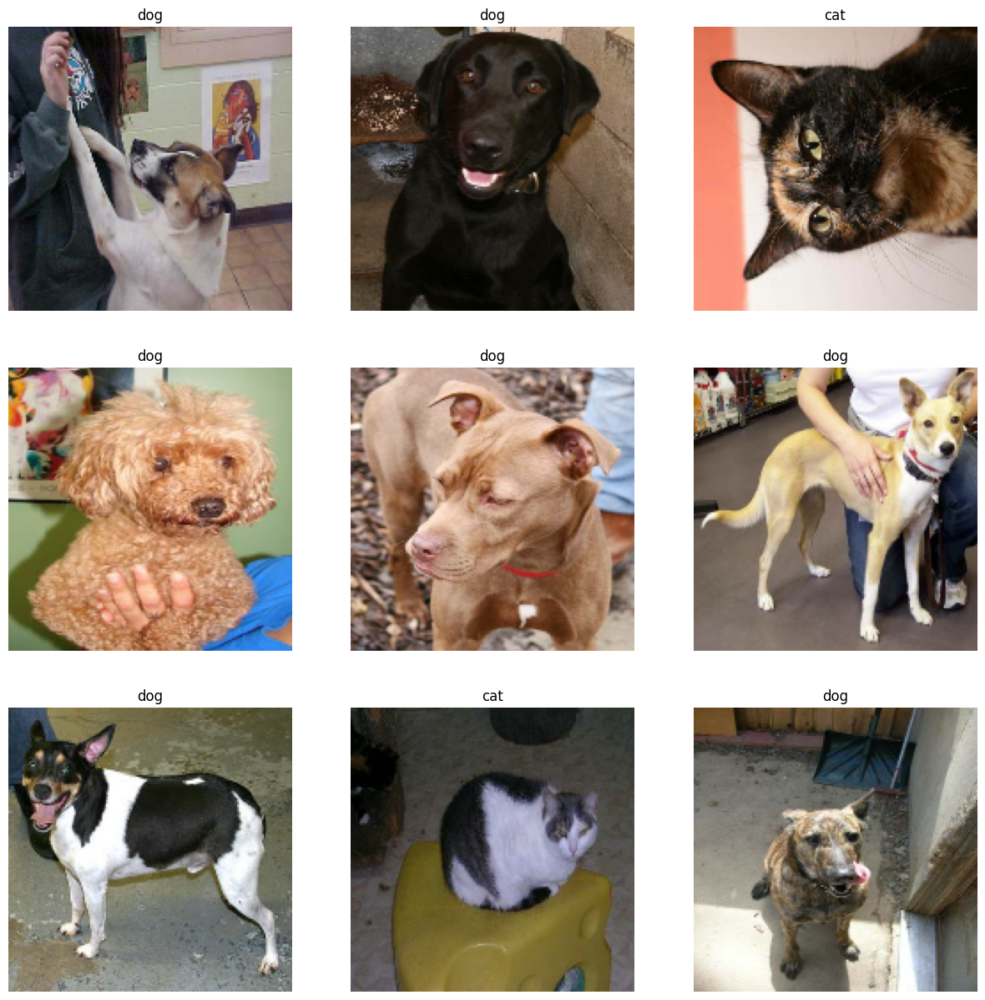

In [16]:
#chamando função para plotar dataset de treino
plot_dataset(dataset_train)

2024-04-28 22:17:51.659305: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


<Figure size 640x480 with 0 Axes>

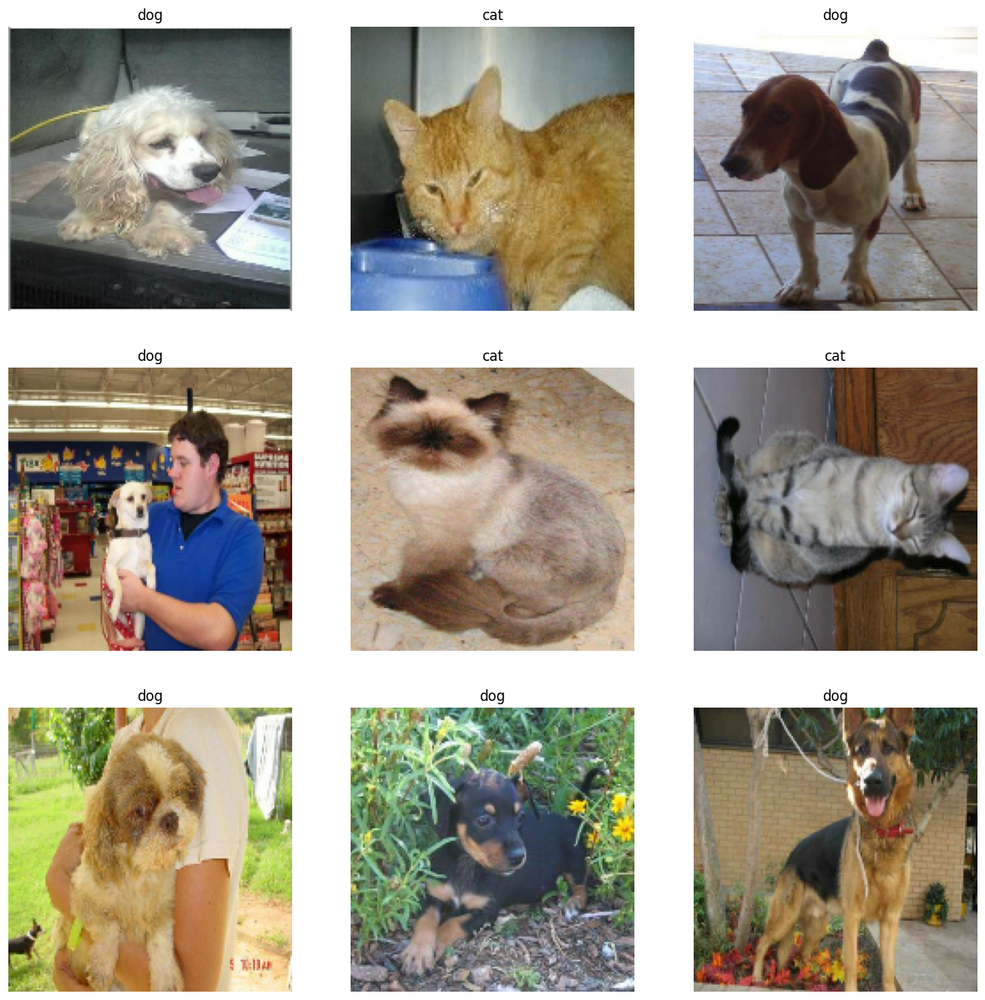

In [17]:
#chamando função para plotar dataset de validação
plot_dataset(dataset_validation)

2024-04-29 00:22:55.753122: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


<Figure size 640x480 with 0 Axes>

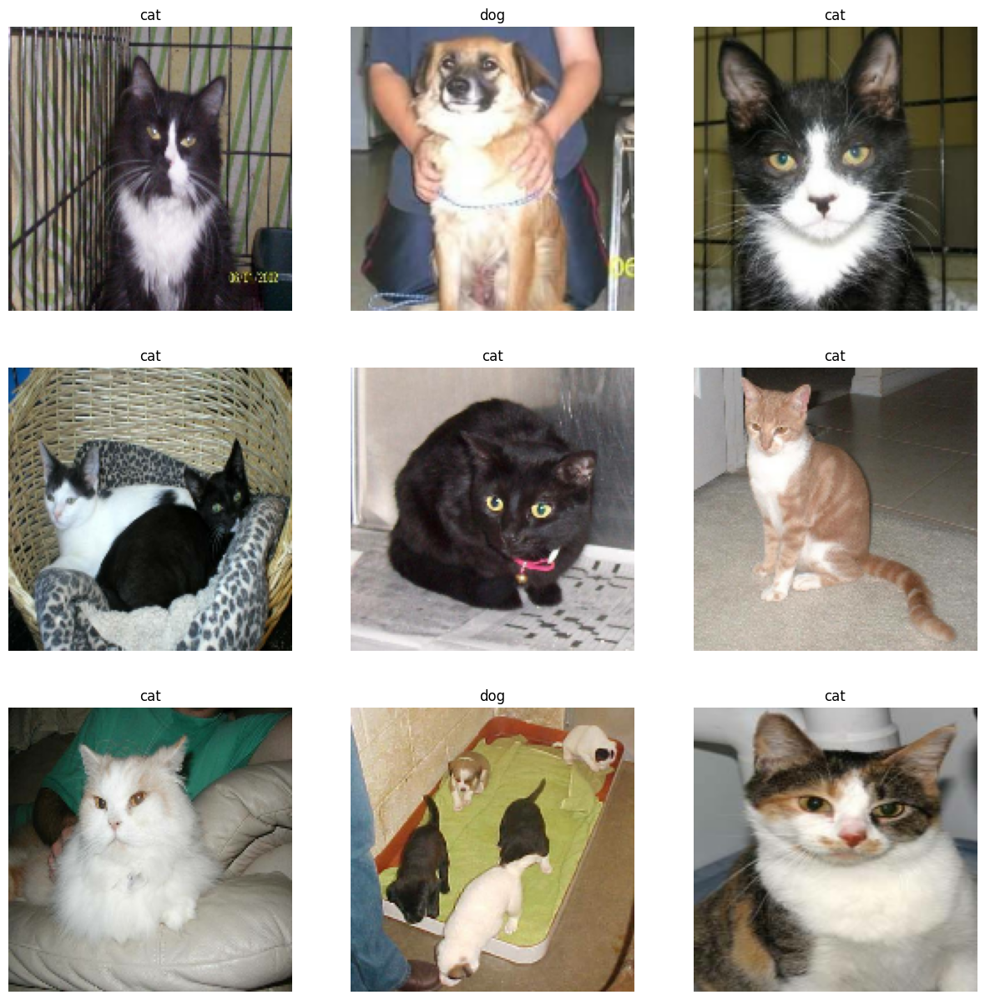

In [47]:
#chamando função para plotar dataset de teste
plot_dataset(dataset_test)

In [19]:
# 3 é o tamanho da kernel 3x3,
# padding='same' permite adicionar zeros ao redor da feature,
# função de ativação que é aplicada na saída da camada e a relu zera o valor negativo e permanece com positivo
model = tf.keras.models.Sequential([
    # Pré-processamento: Redimensiona os valores dos pixels para o intervalo [0, 1]
    tf.keras.layers.Rescaling(
        1. / image_color_channel_size,
        input_shape=image_shape
    ),
    # Primeira camada convolucional: 16 filtros, kernel 3x3, padding 'same', ativação ReLU
    tf.keras.layers.Conv2D(16, 3, padding='same', activation='relu'),
    # Primeira camada de pooling: Reduz dimensões espaciais (altura e largura)
    #consolida o activaction map da camada convulucional
    tf.keras.layers.MaxPooling2D(),
    # Segunda camada convolucional: 32 filtros, kernel 3x3, padding 'same', ativação ReLU
    tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu'),
    # Segunda camada de pooling
    tf.keras.layers.MaxPooling2D(),
    # Terceira camada convolucional: 64 filtros, kernel 3x3, padding 'same', ativação ReLU
    tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu'),
    # Terceira camada de pooling
    tf.keras.layers.MaxPooling2D(),
    # Quarta camada convolucional: 128 filtros, kernel 3x3, padding 'same', ativação ReLU
    #tf.keras.layers.Conv2D(128, 3, padding='same', activation='relu'),
    # Quarta camada de pooling
    #tf.keras.layers.MaxPooling2D(),
    # Achata os mapas de características para um vetor
    tf.keras.layers.Flatten(),
    # Primeira camada densa: 128 neurônios, ativação ReLU
    #aplica uma camada com 128 nós que serão atualizados durante o treinamento
    tf.keras.layers.Dense(128, activation='relu'),
    # Segunda camada densa: 256 neurônios, ativação ReLU
    #tf.keras.layers.Dense(256, activation='relu'),
    # Camada de Dropout para reduzir overfitting
    #tf.keras.layers.Dropout(0.2),
    # Camada de saída: 1 neurônio, ativação Sigmoid para classificação binária
    #quero apenas 1 valor na saída. e a sigmoid retorna sempre -1 e 1 independente do valor que chegar nela
    tf.keras.layers.Dense(1, activation='sigmoid'),
])

# Compila o modelo definindo otimizador, função de perda e métricas
model.compile(
    # Otimizador Adam com taxa de aprendizado definida
    optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
    loss=tf.keras.losses.BinaryCrossentropy(), # Função de perda para classificação binária
    metrics=['accuracy'] # Métrica de acurácia
)

# Exibe um resumo da arquitetura do modelo, incluindo camadas, formas de saída e número de parâmetros
model.summary()

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/preprocessing/tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 160, 160, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 80, 80, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 80, 80, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 40, 40, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 40, 40, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 20, 20, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     3,276,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,300,641 (12.59 MB)

 Trainable params: 3,300,641 (12.59 MB)

 Non-trainable params: 0 (0.00 B)

In [20]:
# Inicia o treinamento do modelo usando o conjunto de dados de treinamento, 
# valida o desempenho com o conjunto de dados de validação e define o número de épocas de treinamento
history = model.fit(
    dataset_train,  # Conjunto de dados utilizado para treinar o modelo
    validation_data=dataset_validation,  # Conjunto de dados de validação para avaliar o modelo a cada época
    epochs=epochs  # Número total de épocas para treinar o modelo
)

Epoch 1/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 17s 234ms/step - accuracy: 0.5204 - loss: 0.6969 - val_accuracy: 0.5470 - val_loss: 0.6696
Epoch 2/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 14s 216ms/step - accuracy: 0.6079 - loss: 0.6559 - val_accuracy: 0.5210 - val_loss: 0.6772
Epoch 3/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 216ms/step - accuracy: 0.6448 - loss: 0.6295 - val_accuracy: 0.6720 - val_loss: 0.6094
Epoch 4/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 216ms/step - accuracy: 0.7180 - loss: 0.5793 - val_accuracy: 0.6807 - val_loss: 0.5844
Epoch 5/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 213ms/step - accuracy: 0.7326 - loss: 0.5482 - val_accuracy: 0.6535 - val_loss: 0.5964
Epoch 6/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 214ms/step - accuracy: 0.7412 - loss: 0.5217 - val_accuracy: 0.6968 - val_loss: 0.5592
Epoch 7/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 14s 217ms/step - accuracy: 0.7654 - loss: 0.4967 - val_accuracy: 0.6819 - val_loss: 0.5854
Epoch 8/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 217ms/step - accuracy: 0.7679 - loss: 0.4726 - val_accu

In [48]:
def plot_dataset_predictions(dataset):
    # Extrai um lote de características (imagens) e rótulos (etiquetas) do conjunto de dados
    features, labels = dataset.as_numpy_iterator().next()

    # Realiza previsões no lote de características e achata o array de previsões
    predictions = model.predict_on_batch(features).flatten()
    # Converte as previsões em 0 ou 1, baseando-se em um limiar de 0.5
    predictions = tf.where(predictions < 0.5, 0, 1)

    # Imprime os rótulos verdadeiros e as previsões do modelo para comparação
    print('Labels:      %s' % labels)
    print('Predictions: %s' % predictions.numpy())

    # Limpa a figura atual do matplotlib e configura o tamanho da figura para visualização
    plt.gcf().clear()
    plt.figure(figsize=(15,15))

    # Loop para plotar as primeiras 9 imagens, rótulos verdadeiros e previsões
    for i in range(9):
        plt.subplot(3,3, i + 1)  # Define a posição da imagem no grid 3x3
        plt.axis('off')  # Remove os eixos para uma visualização mais limpa

        # Mostra a imagem
        plt.imshow(features[i].astype('uint8'))
        # Adiciona um título à imagem com o nome da classe prevista
        plt.title(class_names[predictions[i]])

Labels:      [0 0 0 1 0 0 1 0 1 1 1 1 1 1 0 1 0 1 0 1 1 1 0 0 1 1 1 1 1 0 1 1]
Predictions: [0 0 0 1 0 0 1 0 1 1 1 1 1 1 0 1 0 1 0 1 1 1 0 0 1 1 1 1 1 0 1 1]


<Figure size 640x480 with 0 Axes>

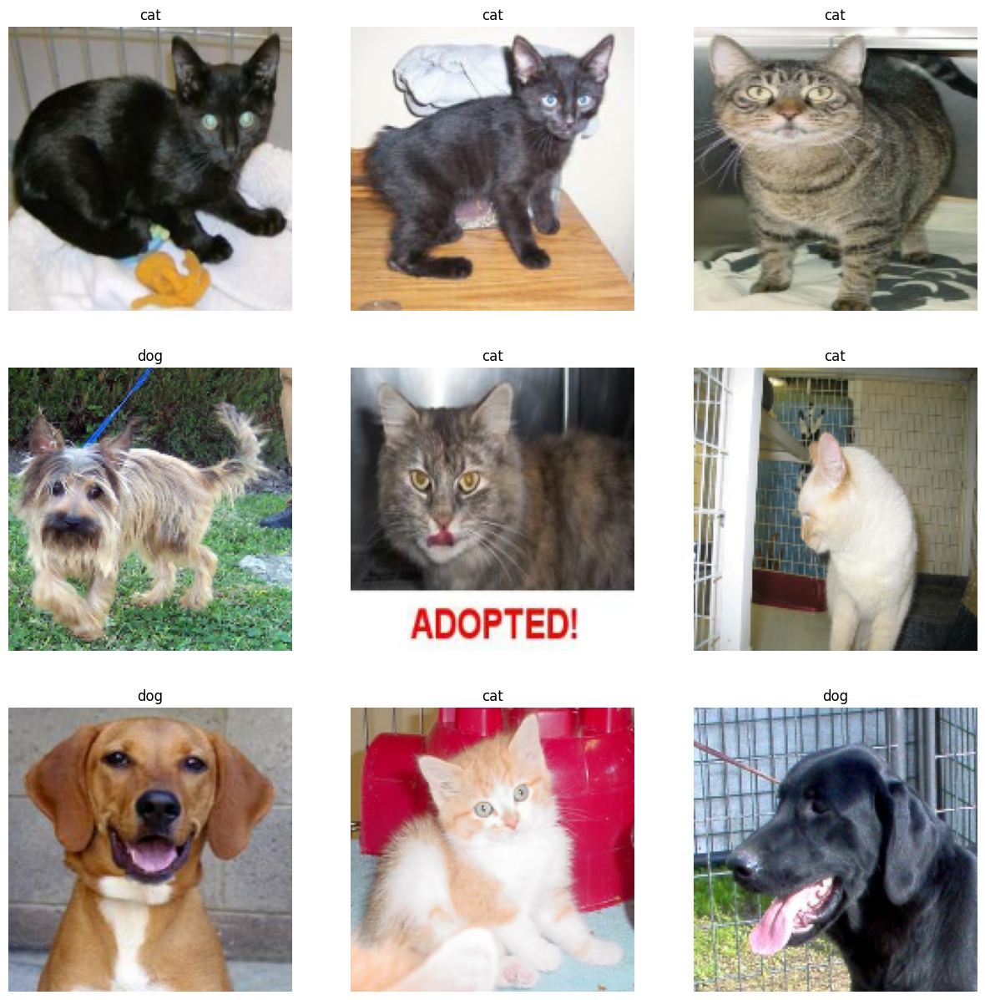

In [49]:
#executando dataset de teste
plot_dataset_predictions(dataset_test)

In [24]:
import os

# Define o caminho onde você deseja salvar o modelo
model_path = 'path/to/model.keras'

# Cria o diretório se ele não existir
os.makedirs(os.path.dirname(model_path), exist_ok=True)

# Agora, salva o modelo no caminho especificado
model.save(model_path)

In [ ]:
#Carregando o modelo
model = tf.keras.models.load_model('path/to/model.keras')

In [25]:
# Função para plotar a performance do modelo durante o treinamento
def plot_model():
    # Recupera os valores de acurácia de treinamento e validação do histórico de treinamento
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    # Recupera os valores de perda (loss) de treinamento e validação do histórico de treinamento
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Cria um intervalo correspondente ao número de épocas de treinamento
    epochs_range = range(epochs)

    # Limpa a figura atual do matplotlib e configura o tamanho da nova figura
    plt.gcf().clear()
    plt.figure(figsize=(15,8))

    # Cria o primeiro subplot para acurácia de treinamento e validação
    plt.subplot(1,2,1)  # Define que haverá 1 linha e 2 colunas de subplots, este é o primeiro
    plt.title('Training and Validation Accuracy')  # Define o título do subplot
    plt.plot(epochs_range, accuracy, label='Training Accuracy')  # Plota a acurácia de treinamento
    plt.plot(epochs_range, val_accuracy, label='Validation Accuracy')  # Plota a acurácia de validação
    plt.legend(loc='lower right')  # Adiciona uma legenda no canto inferior direito

    # Cria o segundo subplot para perda de treinamento e validação
    plt.subplot(1,2,2)  # Este é o segundo subplot na mesma linha
    plt.title('Training and Validation Loss')  # Define o título do subplot
    plt.plot(epochs_range, loss, label='Training Loss')  # Plota a perda de treinamento
    plt.plot(epochs_range, val_loss, label='Validation Loss')  # Plota a perda de validação
    plt.legend(loc='lower right')  # Adiciona uma legenda no canto inferior direito

    # Exibe a figura com os subplots
    plt.show()

<Figure size 640x480 with 0 Axes>

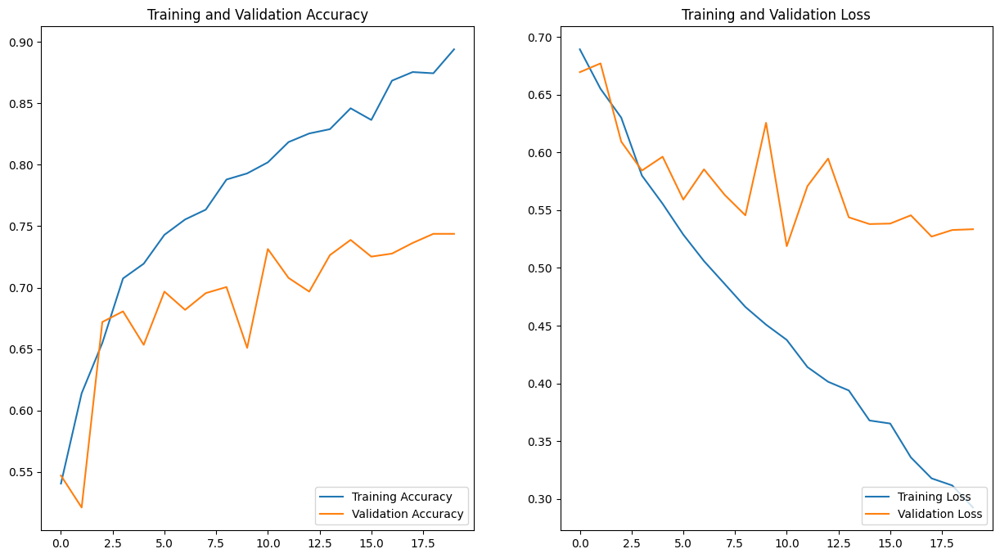

In [26]:
# Chama a função plot_model para visualizar a performance do modelo
plot_model()

In [30]:
#Como vimos uma disparidade entre a precisão do dataset de treinamento com o de validação
# e também do erro entre o dataset de validaão e de treinamento
#código pode estar sofrando de overfitting. onde ele treina muito bem, mas não vai bem com o que não viu ainda

Ajustando Código para melhorar performance do código

In [13]:
# Define uma sequência de operações de aumento de dados para ser aplicada nas imagens
data_augmentation = tf.keras.models.Sequential([
    # Aplica um espelhamento aleatório horizontal nas imagens
    tf.keras.layers.RandomFlip('horizontal'),
    # Rotaciona as imagens aleatoriamente dentro de um intervalo de 20% (-20% a +20%)
    tf.keras.layers.RandomRotation(0.2),
    # Aplica um zoom aleatório nas imagens dentro de um intervalo de 20%
    tf.keras.layers.RandomZoom(0.2)
])

In [14]:
# Função para plotar o resultado da aplicação de aumento de dados em imagens de um dataset
def plot_dataset_data_augmentation(dataset):
    # Limpa a figura atual e configura o tamanho da figura que será exibida
    plt.gcf().clear()
    plt.figure(figsize=(15,15))

    # Itera sobre o dataset, mas pega apenas o primeiro lote de imagens
    for features, _ in dataset.take(1):
        # Seleciona a primeira imagem do lote para demonstração
        feature = features[0]

        # Gera e plota 9 versões aumentadas da imagem selecionada
        for i in range(9):
            # Aplica as operações de aumento de dados na imagem selecionada
            # tf.expand_dims adiciona uma dimensão extra para simular um lote de uma única imagem
            feature_data_augmentation = data_augmentation(tf.expand_dims(feature, 0))

            # Configura o subplot para a imagem atual
            plt.subplot(3, 3, i + 1)  # 3x3 grid, posição i+1
            plt.axis('off')  # Remove os eixos para uma visualização mais limpa

            # Exibe a imagem. A divisão por `image_color_channel_size` ajusta os valores dos pixels
            # para o intervalo esperado pelo matplotlib (geralmente 0 a 1 para floats ou 0 a 255 para inteiros)
            plt.imshow(feature_data_augmentation[0] / image_color_channel_size)

2024-04-28 23:57:56.103880: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


<Figure size 640x480 with 0 Axes>

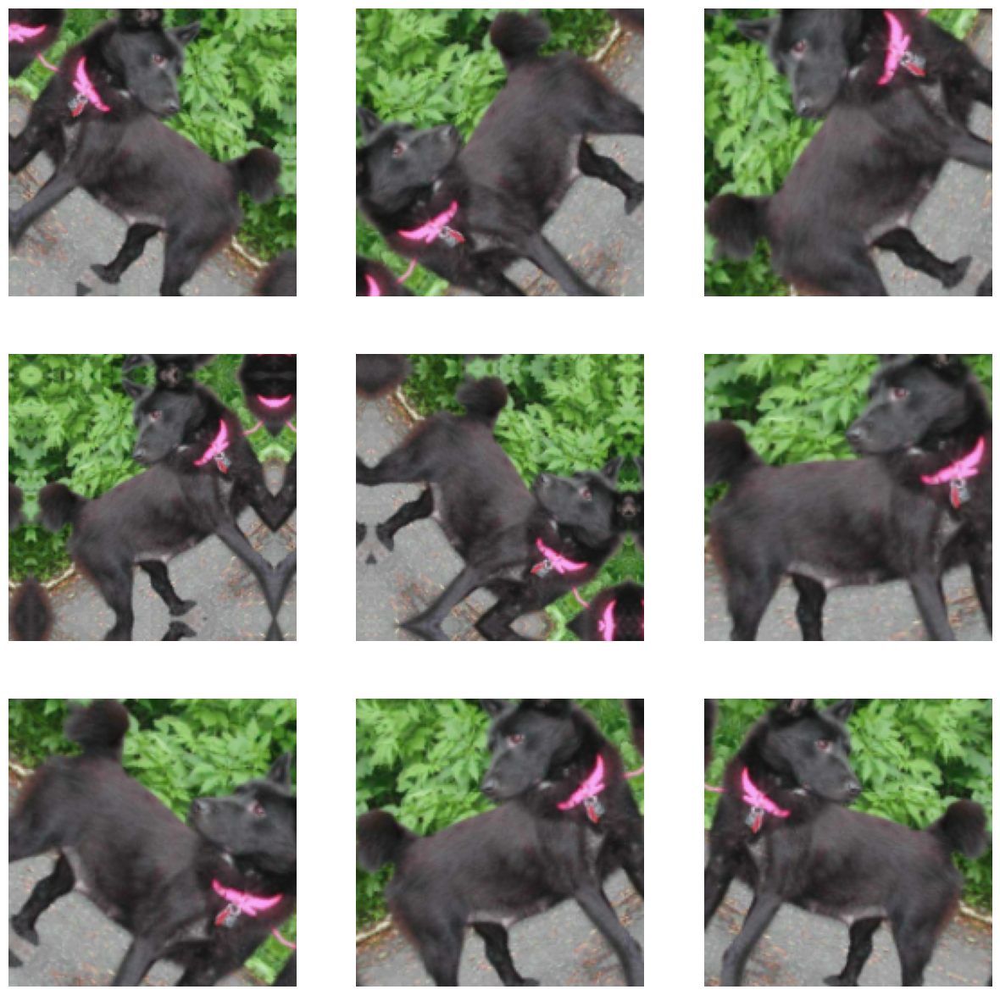

In [15]:
# Chama a função passando o dataset de treinamento como argumento
plot_dataset_data_augmentation(dataset_train)

In [16]:
# Instanciando um modelo MobileNetV2 para transferência de aprendizado
#fazendo uso de um modelo já treinado de transfer learning
model_transfer_learning = tf.keras.applications.MobileNetV2(
    # Define o formato de entrada das imagens conforme o esperado pelo modelo
    input_shape=image_shape,
    # Exclui a camada superior (top) do modelo, permitindo adicionar novas camadas que se adequem ao seu problema específico
    include_top=False,
    # Utiliza os pesos pré-treinados no ImageNet, uma grande base de dados de imagens para treinamento de modelos de deep learning
    weights='imagenet'
)

#setando trainable como falso para que não tenha os parametros atualizados durante o treinamento
#pois queremos usar um modelo já pronto e usa-lo do jeito que ele está
model_transfer_learning.trainable = False

#summary analisar um resumo do modelo
# Imprime um resumo da arquitetura do modelo, incluindo nomes das camadas,
# tipos de camadas, formas de saída de cada camada e número de parâmetros
model_transfer_learning.summary()

Model: "mobilenetv2_1.00_160"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 160, 160,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 80, 80,    │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 80, 80,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 80, 80,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 80, 80,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 80, 80,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 80, 80,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 80, 80,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 80, 80,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 81, 81,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 40, 40,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 40, 40,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 40, 40,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 40, 40,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [18]:
# Criando o modelo do tipo sequencial, o que significa que as camadas serão aplicadas uma após a outra em sequência
model = tf.keras.models.Sequential([
    # Primeira camada: Rescaling. Esta camada é responsável por normalizar os valores dos pixels das imagens
    # de entrada para que variem de -1 a 1, o que ajuda no processo de treinamento do modelo.
    tf.keras.layers.Rescaling(
        1. / (image_color_channel_size / 2),  # Fator de escala para normalização
        offset=-1,  # Deslocamento aplicado após a escala, ajustando os valores para o intervalo desejado
        input_shape=image_shape  # Definindo o formato da entrada conforme as imagens que serão usadas
    ),

    # Camada de aumento de dados (data augmentation), que ajuda a evitar o overfitting ao aumentar a diversidade do conjunto de treinamento
    data_augmentation,
    # Inserindo o modelo de transferência de aprendizado pré-treinado (MobileNetV2, neste caso)
    model_transfer_learning,
    # Camada de GlobalAveragePooling2D para reduzir as dimensões espaciais da saída do modelo pré-treinado
    tf.keras.layers.GlobalAveragePooling2D(),
    # Camada de Dropout para reduzir o overfitting, descartando aleatoriamente um conjunto de características durante o treinamento
    tf.keras.layers.Dropout(0.2),
    # Camada densa final com uma única unidade e ativação sigmoid, usada para classificação binária (cães vs gatos, por exemplo)
    # A função de ativação sigmoid retorna um valor entre 0 e 1, que pode ser interpretado como a probabilidade da classe 1
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compilando o modelo, definindo o otimizador, a função de perda e as métricas de avaliação
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),  # Otimizador Adam com taxa de aprendizagem definida
    loss=tf.keras.losses.BinaryCrossentropy(),  # Função de perda para classificação binária
    metrics=['accuracy']  # Métrica de avaliação do modelo
)

# Imprimindo um resumo do modelo, mostrando a arquitetura, incluindo as camadas, formas de saída e número de parâmetros
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_160            │ (None, 5, 5, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [19]:
# Re-treinaodo o modelo após as alterações para melhorar a performance, 
# valida o desempenho com o conjunto de dados de validação e define o número de épocas de treinamento
history = model.fit(
    dataset_train,  # Conjunto de dados utilizado para treinar o modelo
    validation_data=dataset_validation,  # Conjunto de dados de validação para avaliar o modelo a cada época
    epochs=epochs  # Número total de épocas para treinar o modelo
)

Epoch 1/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 35s 485ms/step - accuracy: 0.4954 - loss: 0.8205 - val_accuracy: 0.7389 - val_loss: 0.5446
Epoch 2/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 39s 469ms/step - accuracy: 0.6795 - loss: 0.6048 - val_accuracy: 0.8626 - val_loss: 0.3986
Epoch 3/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 41s 468ms/step - accuracy: 0.7769 - loss: 0.4906 - val_accuracy: 0.9208 - val_loss: 0.3106
Epoch 4/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 40s 460ms/step - accuracy: 0.8339 - loss: 0.3979 - val_accuracy: 0.9394 - val_loss: 0.2509
Epoch 5/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 40s 449ms/step - accuracy: 0.8768 - loss: 0.3454 - val_accuracy: 0.9468 - val_loss: 0.2162
Epoch 6/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 31s 500ms/step - accuracy: 0.8625 - loss: 0.3362 - val_accuracy: 0.9567 - val_loss: 0.1833
Epoch 7/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 40s 481ms/step - accuracy: 0.8814 - loss: 0.2951 - val_accuracy: 0.9579 - val_loss: 0.1678
Epoch 8/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 41s 484ms/step - accuracy: 0.8780 - loss: 0.2874 - val_accu

In [20]:
# Função para plotar a performance do modelo durante o treinamento
def plot_model():
    # Recupera os valores de acurácia de treinamento e validação do histórico de treinamento
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    # Recupera os valores de perda (loss) de treinamento e validação do histórico de treinamento
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Cria um intervalo correspondente ao número de épocas de treinamento
    epochs_range = range(epochs)

    # Limpa a figura atual do matplotlib e configura o tamanho da nova figura
    plt.gcf().clear()
    plt.figure(figsize=(15,8))

    # Cria o primeiro subplot para acurácia de treinamento e validação
    plt.subplot(1,2,1)  # Define que haverá 1 linha e 2 colunas de subplots, este é o primeiro
    plt.title('Training and Validation Accuracy')  # Define o título do subplot
    plt.plot(epochs_range, accuracy, label='Training Accuracy')  # Plota a acurácia de treinamento
    plt.plot(epochs_range, val_accuracy, label='Validation Accuracy')  # Plota a acurácia de validação
    plt.legend(loc='lower right')  # Adiciona uma legenda no canto inferior direito

    # Cria o segundo subplot para perda de treinamento e validação
    plt.subplot(1,2,2)  # Este é o segundo subplot na mesma linha
    plt.title('Training and Validation Loss')  # Define o título do subplot
    plt.plot(epochs_range, loss, label='Training Loss')  # Plota a perda de treinamento
    plt.plot(epochs_range, val_loss, label='Validation Loss')  # Plota a perda de validação
    plt.legend(loc='lower right')  # Adiciona uma legenda no canto inferior direito

    # Exibe a figura com os subplots
    plt.show()

<Figure size 640x480 with 0 Axes>

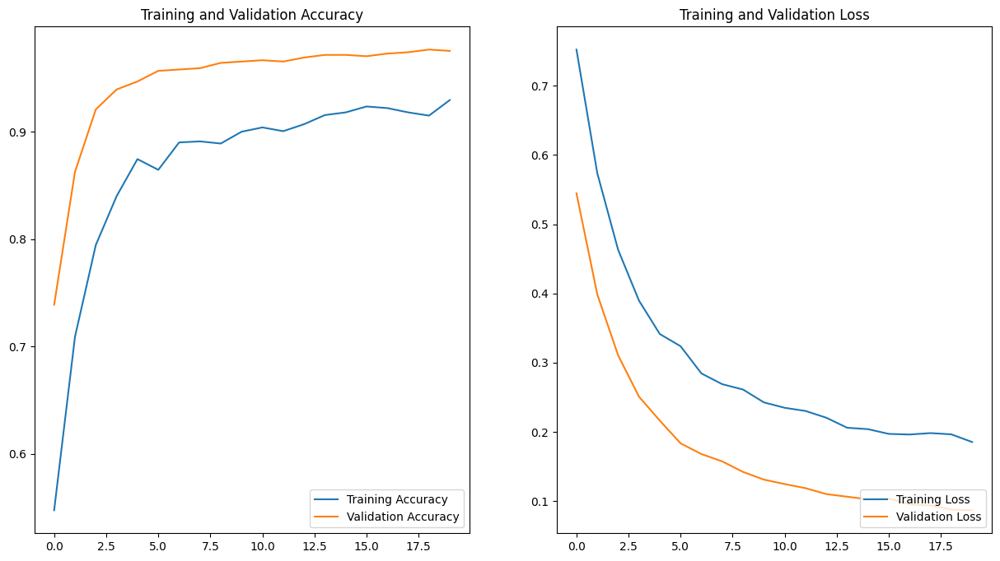

In [21]:
# Chama a função plot_model para visualizar a performance do modelo
plot_model()

In [ ]:
#Após os ajustes o modelo treinado mostrou melhor precisão e menor erro

Labels:      [1 0 0 0 1 1 0 1 1 1 0 0 0 0 0 1 0 1 0 1 1 1 1 1 1 1 0 1 0 0 1 1]
Predictions: [1 0 0 0 1 1 0 1 1 1 0 0 0 0 0 1 0 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0]


<Figure size 640x480 with 0 Axes>

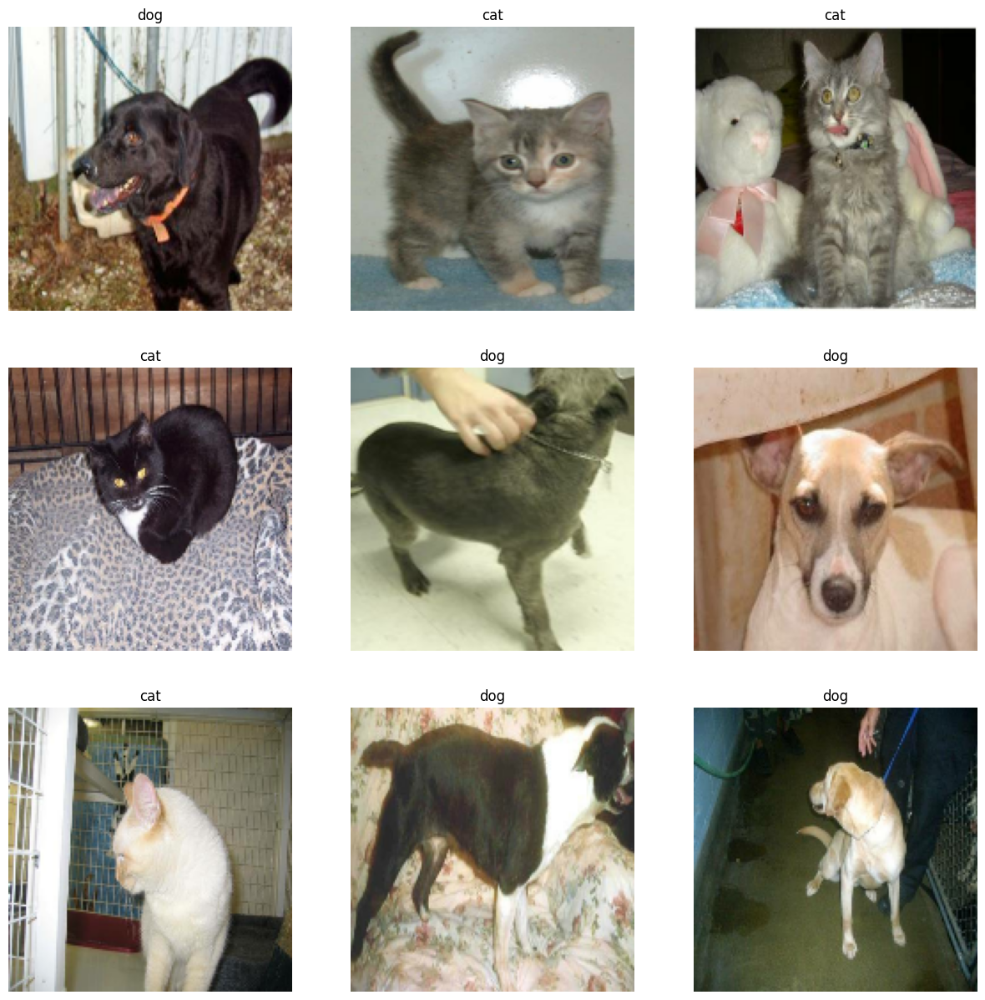

In [50]:
#executando dataset de teste após ajustes. veja que performou melhor.
plot_dataset_predictions(dataset_test)